<a href="https://colab.research.google.com/github/Divyanshu9382/Machine-Learning/blob/main/Logistic_regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model  import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet , ElasticNetCV , LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
!pip install scikit-learn

In [4]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import pickle

In [5]:
!pip install -U ydata-profiling[notebook]==4.0.0 matplotlib==3.5.1

In [6]:
import pandas as pd


In [7]:
df = pd.read_csv('/content/drive/MyDrive/Dataset/diabetes.csv')

In [8]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


# DATA PROFILE

In [9]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df,title="Profiling Report")

/usr/local/lib/python3.10/dist-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/usr/local/lib/python3.10/dist-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [10]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df['BMI']=df['BMI'].replace(0,df['BMI'].mean())

In [13]:
df['BMI']

0      33.6
1      26.6
2      23.3
3      28.1
4      43.1
       ... 
763    32.9
764    36.8
765    26.2
766    30.1
767    30.4
Name: BMI, Length: 768, dtype: float64

# REMOVING ALL ZEROS FROM FEATURE COLUMNS

In [14]:
df['Glucose']=df['Glucose'].replace(0,df['Glucose'].mean())
df['BloodPressure']=df['BloodPressure'].replace(0,df['BloodPressure'].mean())
df['SkinThickness']=df['SkinThickness'].replace(0,df['SkinThickness'].mean())
df['Insulin']=df['Insulin'].replace(0,df['Insulin'].mean())
df['DiabetesPedigreeFunction']=df['DiabetesPedigreeFunction'].replace(0,df['DiabetesPedigreeFunction'].mean())

# AGAIN GENERATE PROFILE REPORT

In [15]:
profile = ProfileReport(df,title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
profile.to_file("report2.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# # prompt: CREATE BOX PLOT

# # Create a box plot of the data
# df.boxplot(figsize=(20, 20))
# plt.title('Box Plot of Diabetes Data')
# plt.xlabel('Features')
# plt.ylabel('Values')
# plt.show()


# CHECKING OUTLIERS

<AxesSubplot:>

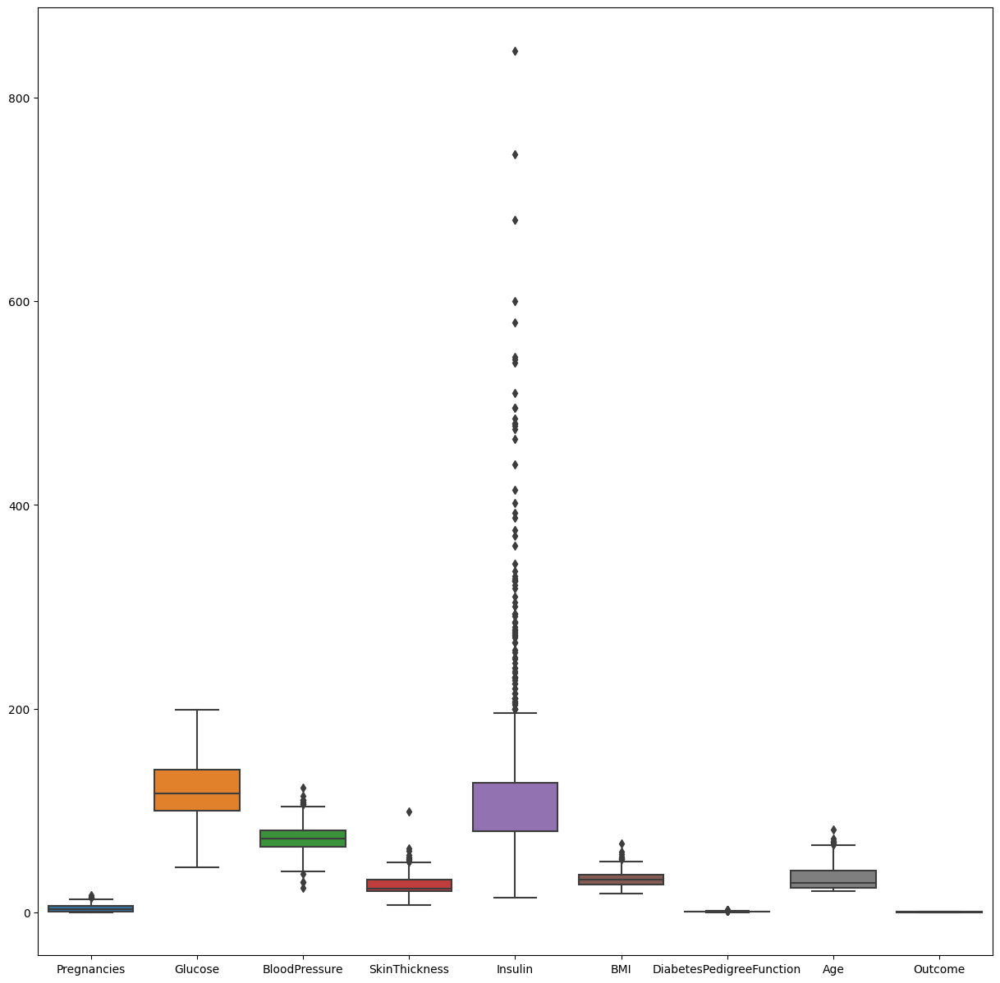

In [18]:
fig , ax = plt.subplots(figsize = (15,15))
sns.boxplot(data= df , ax = ax)

# REMOVING OUTLIERS

In [19]:
q = df['Insulin'].quantile(.70)
df_new = df[df['Insulin']<q]

<AxesSubplot:>

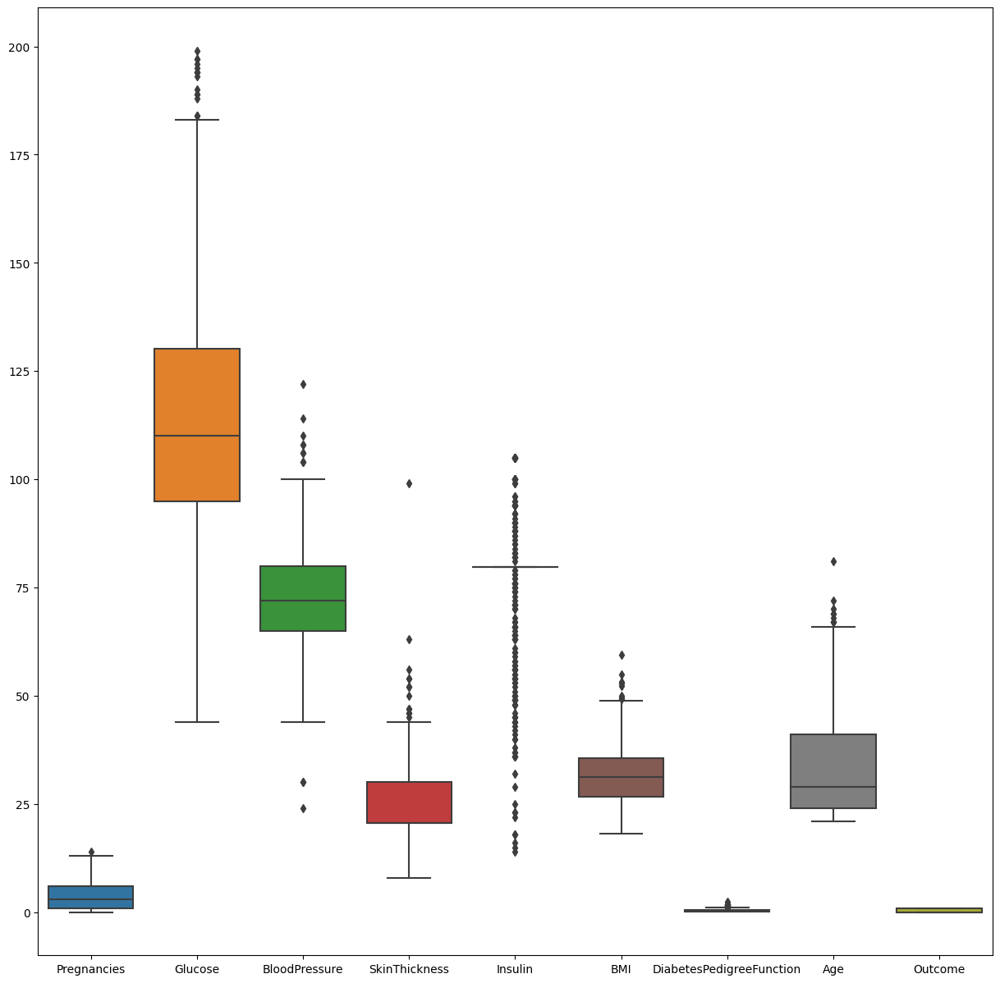

In [20]:
fig , ax = plt.subplots(figsize = (15,15))
sns.boxplot(data= df_new, ax = ax)

In [21]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.000000,79.799479,44.0,0.403,43,1
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


# REMOVE OUTLIER FROM ALL COLUMNS

In [22]:
q = df['SkinThickness'].quantile(.99)
df_new = df[df['SkinThickness']<q]

q = df['DiabetesPedigreeFunction'].quantile(.99)
df_new = df[df['DiabetesPedigreeFunction']<q]

q = df['Pregnancies'].quantile(.70)
df_new = df[df['Pregnancies']<q]

q = df['BMI'].quantile(.99)
df_new = df[df['BMI']<q]

<AxesSubplot:>

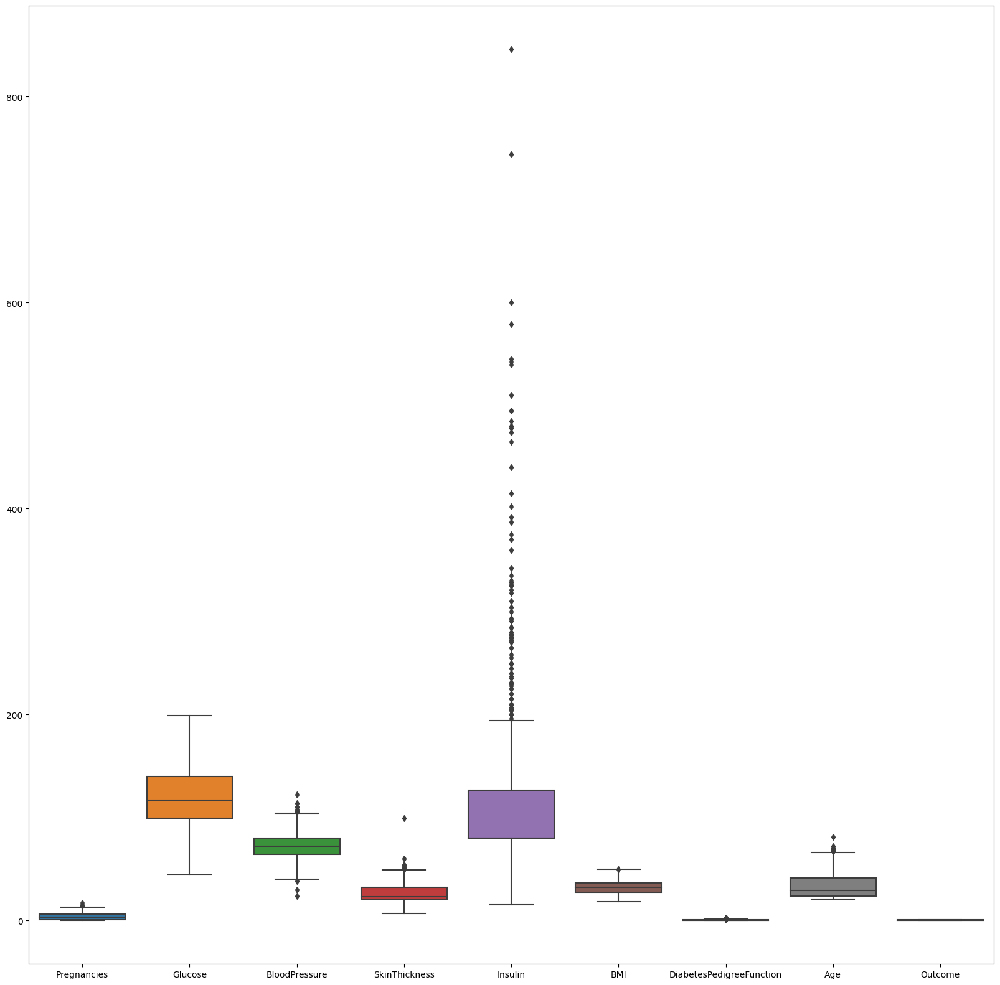

In [23]:
fig , ax = plt.subplots(figsize = (20,20))
sns.boxplot(data= df_new, ax = ax)

In [24]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


# SEPARaTE DATA INTO X AND Y COLUMN

In [25]:
y = df_new['Outcome']

In [26]:
y


0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 760, dtype: int64

In [27]:
x = df_new.drop(columns=['Outcome'])

In [28]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


# SCALING DATASET

In [29]:
scaler = StandardScaler()
ProfileReport(pd.DataFrame(scaler.fit_transform(x)))
x_scaled=scaler.fit_transform(x)

<AxesSubplot:>

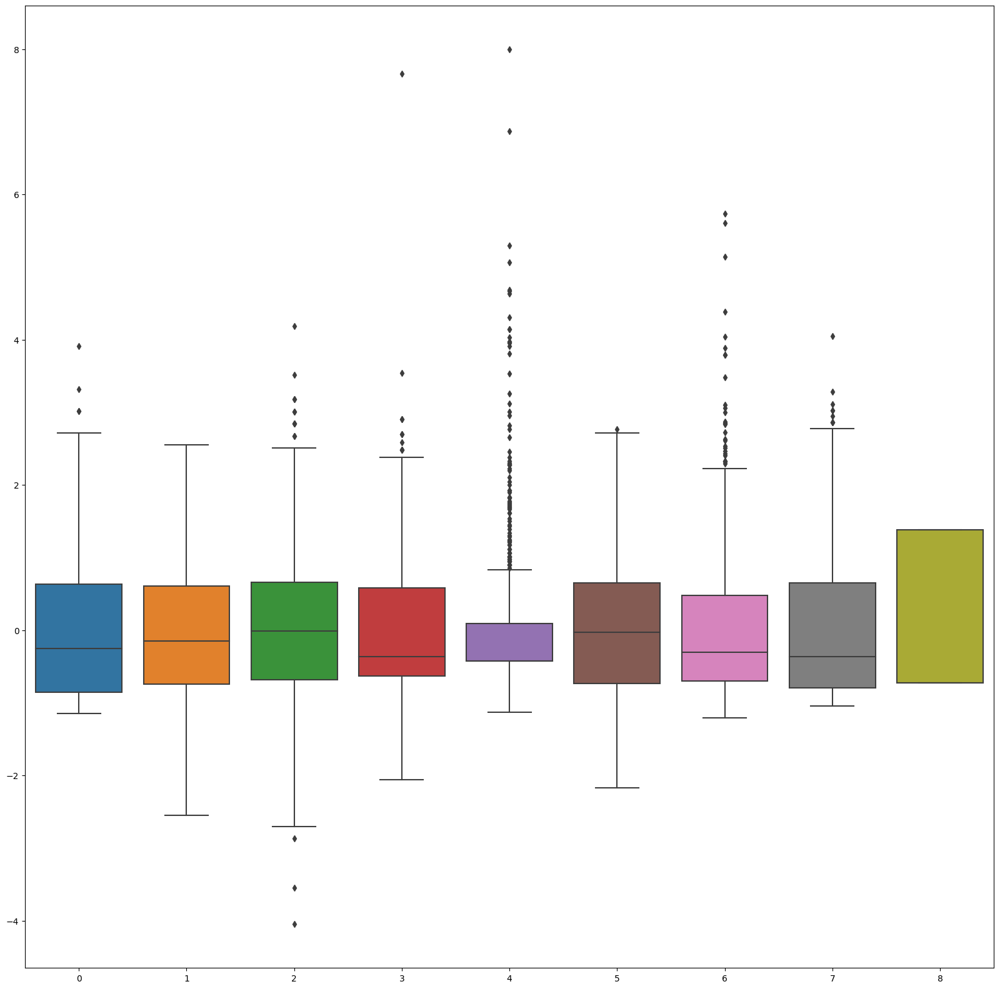

In [30]:
fig , ax = plt.subplots(figsize = (20,20))
sns.boxplot(data= scaler.fit_transform(df_new), ax = ax)

# VIF SCORE

In [31]:
# prompt: generate vif score of x_scaled

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(x_scaled, i) for i in range(x_scaled.shape[1])]
vif["features"] = x.columns
vif


,VIF Factor,features
0,1.427410,Pregnancies
1,1.351143,Glucose
2,1.251752,BloodPressure
3,1.440106,SkinThickness
4,1.287203,Insulin
5,1.519191,BMI
6,1.051861,DiabetesPedigreeFunction
7,1.609091,Age


In [32]:
x_train,x_test,y_train, y_test =train_test_split(x_scaled , y, test_size =20, random_state=144)

In [33]:
x_train

array([[-0.55308385, -1.03694741, -1.02198767, ..., -1.35108195,
        -0.85611031, -0.70503375],
       [ 0.0418825 ,  0.83829996,  0.15477199, ...,  0.41910897,
        -0.25832148, -0.28071822],
       [ 0.0418825 , -0.37896588, -0.5176621 , ..., -0.04673074,
         0.00667769, -0.36558133],
       ...,
       [-1.1480502 ,  1.82527226, -1.02198767, ...,  0.372525  ,
         1.85859049, -1.04448618],
       [-0.55308385,  0.41061196, -0.18144505, ..., -0.51257046,
         0.22545607, -0.87475997],
       [ 0.33936568, -0.74085572, -1.52631324, ...,  0.27935706,
         0.09295649, -0.28071822]])

# BUILD MODEL

In [35]:
logr = LogisticRegression(verbose=1)

In [37]:
logr.fit(x_train,y_train)

LogisticRegression(verbose=1)

In [49]:
x_test[1]

array([ 0.0418825 ,  0.6409055 ,  0.15477199, -0.62668025, -0.41997205,
       -0.71443434, -0.69279687,  0.56791284])

In [56]:
logr.predict_proba([x_test[0]])

array([[0.31915618, 0.68084382]])

In [57]:
logr.predict([x_test[0]])

array([1])

In [58]:
logr.predict_log_proba([x_test[0]])

array([[-1.14207471, -0.38442233]])

In [53]:
y_test.iloc[0]

1

In [ ]:
y_test

In [59]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear')

In [60]:
logr_liblinear.fit(x_train,y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [65]:
y_pred_liblinear=logr_liblinear.predict(x_test)
y_pred_liblinear

array([1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0])

In [67]:
y_predict_default=logr.predict(x_test)
y_predict_default

array([1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0])

#  MEASURE ACCURACY

In this we compare two models with different solver

In [69]:
confusion_matrix(y_test,y_predict_default)

array([[14,  2],
       [ 2,  2]])

In [70]:
confusion_matrix(y_test,y_pred_liblinear)

array([[14,  2],
       [ 2,  2]])

In [73]:
def model_eval(y_true,y_pred):
  tn, fp, fn,  tp, = confusion_matrix(y_test,y_pred).ravel()
  accuracy=(tp+tn)/(tp+tn+fp+fn)
  precision=tp/(tp+fp)
  recall=tp/(tp+fn)
  specifity=tn/(fn+tn)
  result={"Accuracy":accuracy,"Precision":precision,"recall":recall,"Specifity":specifity}
  return result
model_eval(y_test,y_pred_liblinear)

{'Accuracy': 0.8, 'Precision': 0.5, 'recall': 0.5, 'Specifity': 0.875}

In [75]:
def model_eval(y_true,y_pred):
  tn, fp, fn,  tp, = confusion_matrix(y_test,y_pred).ravel()
  accuracy=(tp+tn)/(tp+tn+fp+fn)
  precision=tp/(tp+fp)
  recall=tp/(tp+fn)
  specifity=tn/(fn+tn)
  result={"Accuracy":accuracy,"Precision":precision,"recall":recall,"Specifity":specifity}
  return result
model_eval(y_test,y_predict_default)

{'Accuracy': 0.8, 'Precision': 0.5, 'recall': 0.5, 'Specifity': 0.875}

# ROC AND AUC

In [76]:
roc_auc_score(y_test,y_pred_liblinear)

0.6875

In [77]:
roc_auc_score(y_test,y_predict_default)

0.6875

In [79]:
fpr, tpr, threshold =roc_curve(y_test,y_pred_liblinear)

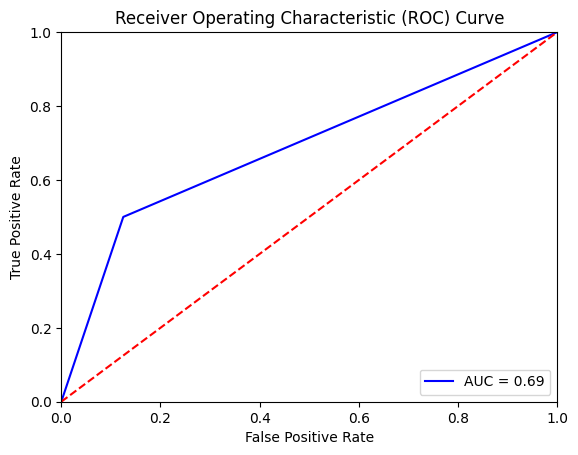

In [80]:
# prompt: draw roc and auc graph

# Plot the ROC curve
plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc_score(y_test, y_pred_liblinear))
plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()
